<h1 style='text-align: center;'>YOLOv8l Implementation</h1>
<hr>
<div style="text-align: center" ><b>AGDEPPA, K.R | TERO, M.D </b></div>

## Import the Libraries

**NOTE:** *This notebook is documented using Google Style Guides for variable naming convention and NumPy-style for docstrings*

In [2]:
# Importing the required libraries
from ultralytics import YOLO
import torch

import cv2
import matplotlib.image as mpimg
from IPython.display import HTML

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd

import os
import random
from base64 import b64encode

sns.set_style('darkgrid')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Load data & Detections

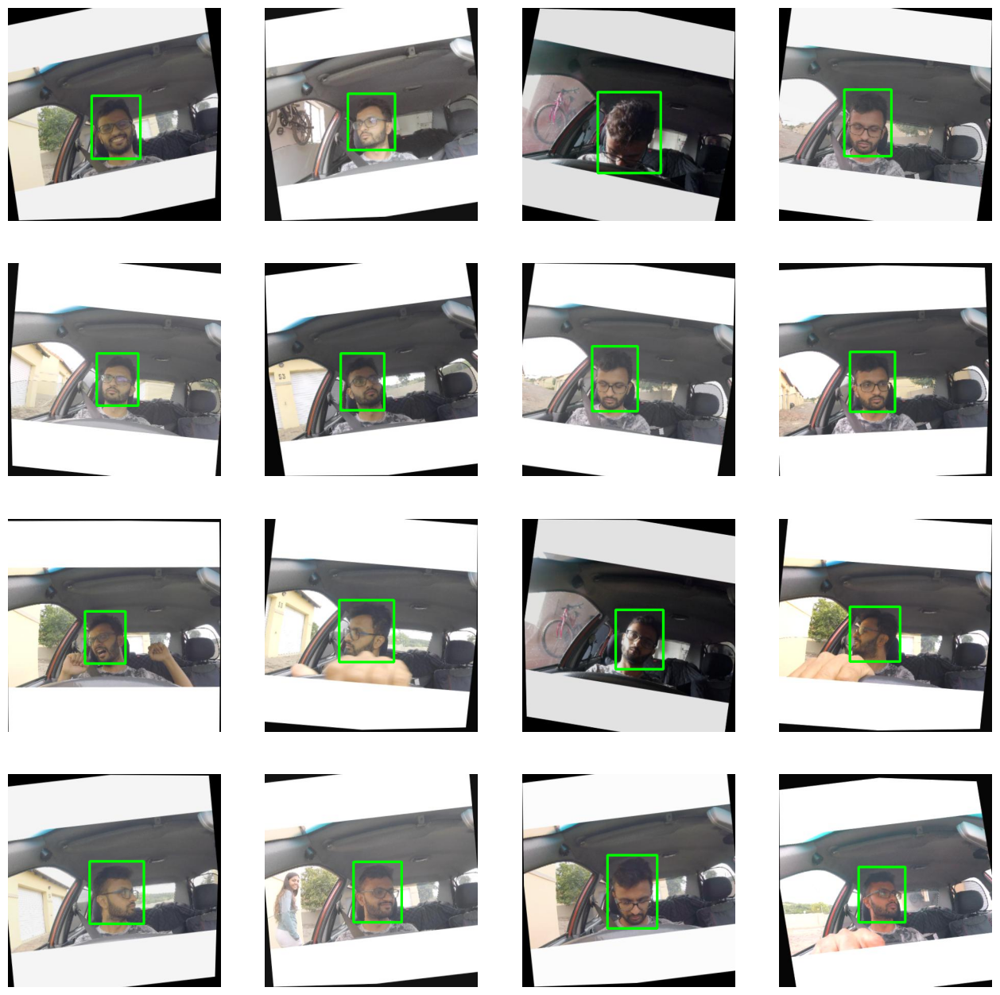

In [3]:
# Define the paths to the images and labels directories
TRAIN_IMAGES = "/kaggle/input/dataset/train/images"
TRAIN_LABELS = "/kaggle/input/dataset/train/labels"

TEST_IMAGES = "/kaggle/input/dataset/test/images"
TEST_LABELS = "/kaggle/input/dataset/test/labels"

VAL_IMAGES = "/kaggle/input/dataset/valid/images"
VAL_LABELS = "/kaggle/input/dataset/valid/labels"

# Get a list of all the image files in the training images directory
IMAGE_FILES = os.listdir(TRAIN_IMAGES)

# Choose 16 random image files from the list
RANDOM_IMAGES = random.sample(IMAGE_FILES, 16)

# Set up the subplot
_, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for idx, image_file in enumerate(RANDOM_IMAGES):
    ROW = idx // 4
    COL = idx % 4
    
    # Load the image
    IMAGE_PATH = os.path.join(TRAIN_IMAGES, image_file)
    IMAGE = cv2.imread(IMAGE_PATH)

    # Load the labels for this image
    LABEL_FILE = os.path.splitext(image_file)[0] + ".txt"
    LABEL_PATH = os.path.join(TRAIN_IMAGES, LABEL_PATH)
    with open(LABEL_PATH, "r") as f:
        LABELS = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    for label in LABELS:
        if len(label.split()) != 5:
            continue
        _, X_CENTER, Y_CENTER, WIDTH, HEIGHT = map(float, label.split())
        x_min = int((X_CENTER - WIDTH/2) * IMAGE.shape[1])
        y_min = int((Y_CENTER - HEIGHT/2) * IMAGE.shape[0])
        x_max = int((X_CENTER + WIDTH/2) * IMAGE.shape[1])
        y_max = int((Y_CENTER + HEIGHT/2) * IMAGE.shape[0])
        cv2.rectangle(IMAGE, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[ROW, COL].imshow(cv2.cvtColor(IMAGE, cv2.COLOR_BGR2RGB))
    axs[ROW, COL].axis('off')

plt.show()

# Image Metadata

In [4]:
# Load an image using OpenCV
IMAGE_PATH = "/kaggle/input/dataset/test/images/GOPR0492_MP4-129_jpg.rf.4ab62a8bfe44d47dd8d0fb675fe95ae6.jpg"
IMAGE = cv2.imread(IMAGE_PATH)

# Get the size of the image
HEIGHT, WIDTH, CHANNELS = IMAGE.shape
print(f"The image has dimensions {WIDTH}x{HEIGHT} and {CHANNELS} channels.")

The image has dimensions 416x416 and 3 channels.


# YOLOv8l

In [5]:
 # Loading a pretrained model
yolo8l_model = YOLO('yolov8L.pt')
yolo8l_model

100%|██████████| 83.7M/83.7M [00:01<00:00, 87.2MB/s]


YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(320, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_r

In [6]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
def move_model(model, device):
    """
    Move a PyTorch model to the specified device.

    Parameters
    ----------
    model : torch.nn.Module
        The PyTorch model to be moved to the device.
    device : torch.device
        The target device for the model. Should be a valid PyTorch device, such as 'cuda' or 'cpu'.

    Returns
    -------
    torch.nn.Module
        The PyTorch model moved to the specified device.

    Examples
    --------
    >>> DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    >>> yolo8x_model = ...  # Instantiate your YOLO model
    >>> model = move_model(yolo8x_model, DEVICE)

    Notes
    -----
    This function utilizes PyTorch's `to` method to move the model to the specified device.

    See Also
    --------
    torch.device, torch.nn.Module.to
    """
    print(device)

    model = model.to(device)
    return model
yolo8l_model = move_model(yolo8l_model, DEVICE)

cuda


# 🚀Model Training

In [7]:
# Training the model
YAML_PATH = '/kaggle/input/dataset/data.yaml'
yolo8l_model.train(data = YAML_PATH,
            epochs = 100,
            imgsz = HEIGHT,
            seed = 42,
            batch = 32,
            workers = 4)

engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/kaggle/input/dataset/data.yaml, epochs=100, patience=50, batch=32, imgsz=416, save=True, save_period=-1, cache=False, device=cuda:0, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, 

100%|██████████| 755k/755k [00:00<00:00, 4.27MB/s]
2023-12-11 09:30:54,428	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2023-12-11 09:30:54,962	INFO util.py:129 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 22.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/dataset/train/labels... 1056 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1056/1056 [00:02<00:00, 377.91it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/dataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/dataset/valid/labels... 103 images, 0 backgrounds, 0 corrupt: 100%|██████████| 103/103 [00:00<00:00, 397.84it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/dataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      9.33G      1.282      2.954      1.619         62        416: 100%|██████████| 33/33 [00:27<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        103        103   0.000946      0.243   0.000668   0.000312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      9.82G      1.025      1.199      1.447         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all        103        103   0.000946      0.243   0.000668   0.000312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      9.83G     0.9751      1.069      1.429         61        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all        103        103   0.000946      0.243   0.000668   0.000312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      9.83G     0.9538      1.046      1.407         44        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103    0.00359     0.0678    0.00214   0.000684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      9.84G     0.9044     0.9832      1.369         60        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.77it/s]

                   all        103        103      0.614      0.522      0.573      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      9.83G     0.9078     0.9526      1.371         50        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.505      0.602      0.528      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      9.84G     0.8559     0.8801      1.315         57        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all        103        103      0.505      0.602      0.528      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      9.84G     0.8259     0.8306      1.292         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.803       0.86      0.866      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      9.85G     0.7912     0.8316      1.266         59        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.818      0.867      0.869       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      9.83G     0.7782     0.7676       1.25         54        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.77it/s]

                   all        103        103      0.572       0.89      0.758      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.84G     0.7868     0.7589      1.237         55        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103      0.883      0.892      0.909      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      9.83G     0.7419     0.7737      1.225         60        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.888      0.897      0.923      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.84G     0.7267     0.7259      1.193         55        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.854      0.847      0.924      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.83G     0.7195        0.7      1.189         59        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.881      0.904      0.922      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      9.84G     0.7065     0.6533      1.185         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.829      0.914      0.923      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      9.82G     0.6952     0.6469      1.183         52        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.836      0.836        0.9      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      9.84G     0.7033     0.6457      1.178         48        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.847      0.898      0.893      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      9.84G     0.6719     0.6337      1.151         55        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.868      0.878      0.914      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      9.84G     0.6597     0.6097      1.145         58        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.809       0.91       0.93      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      9.83G     0.6669     0.6238      1.142         68        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.954      0.935      0.971      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      9.84G     0.6718     0.5877      1.157         68        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.897      0.912      0.946      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      9.83G     0.6528     0.5879      1.134         61        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.845      0.847      0.931      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      9.83G     0.6414     0.5811      1.128         53        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.916      0.889      0.947       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      9.83G     0.6508     0.5977      1.135         49        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.919        0.9      0.952      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      9.84G     0.6408     0.5502      1.128         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.867      0.942      0.945      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      9.83G     0.6456     0.5445      1.134         64        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103      0.894      0.907      0.945      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      9.84G     0.6377      0.547      1.125         62        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.903      0.914      0.937      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      9.82G     0.6228     0.5052      1.109         61        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.942      0.913      0.951      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      9.83G     0.6247     0.5346      1.125         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.849      0.932      0.966      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      9.82G     0.6107     0.5175      1.106         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.911      0.926       0.97      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      9.84G     0.6324     0.5491      1.123         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.943       0.92      0.967      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      9.82G     0.5991     0.5135      1.099         52        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.932      0.927      0.977       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      9.84G     0.6029     0.4881      1.104         56        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.938      0.915      0.968      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       9.8G     0.5918     0.4727      1.085         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all        103        103      0.937      0.943       0.97      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      9.83G     0.6094      0.491      1.114         42        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.916      0.933      0.965      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      9.83G     0.5917     0.4698      1.089         60        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103      0.938      0.871      0.971      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      9.84G     0.5976     0.4613      1.103         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all        103        103      0.916      0.945      0.972      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      9.82G     0.5937     0.4734      1.089         55        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103      0.926      0.938      0.975      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      9.84G     0.5743     0.4436      1.071         67        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.901      0.941      0.966      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      9.84G     0.5779     0.4668      1.088         61        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.912      0.946       0.98      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      9.84G       0.58     0.4528      1.084         62        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.915      0.904      0.971      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      9.83G     0.5737     0.4489      1.083         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.906      0.925      0.958       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      9.84G      0.578     0.4626      1.079         56        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.892      0.922      0.975      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      9.83G     0.5727     0.4697      1.081         50        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.935       0.94      0.976      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      9.84G     0.5631     0.4514      1.076         48        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.911      0.922      0.975      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      9.83G     0.5683     0.4313      1.078         64        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.908      0.944      0.967      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      9.84G     0.5589     0.4154      1.075         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.923      0.946      0.976      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      9.83G     0.5367     0.4298      1.053         58        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.941      0.933      0.974      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      9.84G     0.5408     0.4242      1.055         53        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.919      0.913      0.977      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      9.83G     0.5485     0.4229      1.059         41        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103       0.93      0.933      0.972      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      9.84G     0.5469     0.4073      1.053         57        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.963      0.949      0.978      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      9.83G      0.544     0.4158      1.049         41        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.946       0.95      0.974      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      9.83G     0.5364     0.4038      1.051         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.939      0.967      0.982      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      9.82G     0.5266     0.3783      1.046         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.912      0.956      0.975       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      9.84G     0.5147     0.3772      1.046         49        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.947      0.946      0.978      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.83G     0.5325     0.4035      1.048         49        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.937      0.931      0.979      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      9.84G     0.5291     0.3864      1.041         59        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all        103        103      0.915      0.937      0.974      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      9.83G     0.5256     0.3868      1.051         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103       0.91      0.934      0.972      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      9.84G     0.5341     0.3801      1.051         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all        103        103      0.922      0.935      0.961      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      9.84G     0.5232     0.3914      1.043         41        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.953      0.946      0.968      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      9.83G     0.4986     0.3756      1.024         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.951      0.942      0.975      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      9.84G     0.5043     0.3742      1.028         60        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103       0.95      0.938      0.972      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      9.84G     0.5268     0.3884      1.044         59        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.912      0.962      0.972       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      9.83G     0.5056     0.3626      1.027         61        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.928      0.946      0.979      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      9.84G     0.4968     0.3661      1.027         48        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.936      0.922      0.972      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      9.83G     0.4988     0.3489      1.018         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.913      0.948      0.973      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      9.82G     0.4918     0.3385      1.024         50        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.922      0.946      0.973      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      9.84G     0.5166     0.3664      1.038         66        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.945      0.946      0.968      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      9.83G     0.5025     0.3563      1.027         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all        103        103      0.914      0.951      0.977      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      9.82G     0.4914     0.3296      1.016         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103       0.92      0.934       0.97      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      9.85G      0.494     0.3432      1.028         51        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103       0.93      0.945      0.972      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      9.81G      0.491     0.3303      1.006         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103       0.91      0.938      0.957      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      9.84G     0.4855      0.331      1.012         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.932      0.931      0.952      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      9.84G     0.4835     0.3206      1.009         44        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.941      0.938      0.956      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      9.84G     0.4806     0.3402      1.014         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.932      0.926      0.957      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      9.81G     0.4654     0.3222      1.004         49        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all        103        103      0.926      0.926      0.961      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      9.84G     0.4749     0.3207       1.01         49        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.914      0.936      0.954      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      9.83G     0.4633     0.3166      1.014         58        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103       0.93      0.937      0.967      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      9.84G     0.4727     0.3154       1.01         73        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.919      0.956      0.982      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      9.82G     0.4516      0.305     0.9895         56        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.912      0.935      0.972      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      9.84G     0.4672     0.3035      1.001         63        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.929      0.927      0.957      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      9.83G     0.4507     0.3003     0.9936         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.926      0.938      0.958      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      9.84G     0.4535     0.3155      0.989         54        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.932      0.945      0.961      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      9.81G     0.4519     0.2996     0.9886         60        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.935      0.942      0.941      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      9.84G     0.4549     0.2987     0.9913         49        416: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.934      0.942       0.96      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.82G     0.4671     0.3073      1.002         59        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.941      0.938       0.97      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      9.84G     0.4497     0.2896      0.994         64        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all        103        103      0.932      0.933       0.96      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      9.81G     0.4404     0.2913     0.9853         57        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.934      0.926      0.963      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      9.84G     0.4381      0.293     0.9966         46        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.935      0.935      0.946      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      9.83G     0.4381     0.2864     0.9834         53        416: 100%|██████████| 33/33 [00:25<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.946      0.935      0.952       0.86


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      9.84G     0.3627     0.1957     0.9693         32        416: 100%|██████████| 33/33 [00:26<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.932      0.937      0.954      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      9.82G     0.3581      0.189     0.9619         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all        103        103      0.929      0.937      0.954      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      9.83G     0.3446     0.1848     0.9519         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.931      0.937       0.95      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      9.83G      0.345     0.1794     0.9667         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.936      0.938      0.971      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.83G     0.3392     0.1736      0.948         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all        103        103      0.932      0.938      0.963      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      9.82G     0.3371     0.1758     0.9526         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.939      0.937      0.955      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      9.85G     0.3427     0.1786     0.9572         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all        103        103      0.937      0.937      0.942      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      9.84G     0.3306     0.1765     0.9447         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all        103        103      0.936      0.949      0.959      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      9.84G     0.3263     0.1695     0.9325         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.938      0.949      0.953      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      9.82G     0.3247     0.1706     0.9424         32        416: 100%|██████████| 33/33 [00:25<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all        103        103      0.939      0.937      0.948      0.874



100 epochs completed in 0.811 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 87.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 87.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


                   all        103        103      0.919      0.956      0.982      0.893
                 awake        103         59      0.906      0.977      0.985      0.903
                drowsy        103         44      0.932      0.936      0.979      0.883
Speed: 0.7ms preprocess, 8.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▁▅▇▇█▇█████████████████████████████████
metrics/mAP50-95(B),▁▁▄▆▇▇▆▇▇▇█▇▇█▇▇████████████████████████
metrics/precision(B),▁▁▅▇▇▇▇▇██▇█████████████████████████████
metrics/recall(B),▁▁▅▇▇▇▇▇█▇████▇█▇███████████████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▆▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7dba0e238a90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

# 📈Model Performance
    
```Train Box Loss:```

*The train box loss metric measures the difference between the predicted bounding boxes and the actual bounding boxes of the objects in the training data. A lower box loss means that the model's predicted bounding boxes more closely align with the actual bounding boxes.*

<hr>
    
```Train Class Loss:```

*The train class loss metric measures the difference between the predicted class probabilities and the actual class labels of the objects in the training data. A lower class loss means that the model's predicted class probabilities more closely align with the actual class labels.*

<hr>

```Train DFL Loss:```

*The train DFL (Dynamic Feature Learning) loss metric measures the difference between the predicted feature maps and the actual feature maps of the objects in the training data. A lower DFL loss means that the model's predicted feature maps more closely align with the actual feature maps.*
    
<hr>


```Metrics Precision (B):```

*The metrics precision (B) metric measures the proportion of true positive detections among all the predicted bounding boxes. A higher precision means that the model is better at correctly identifying true positive detections and minimizing false positives.*

<hr>


```Metrics Recall (B):```

*The metrics recall (B) metric measures the proportion of true positive detections among all the actual bounding boxes. A higher recall means that the model is better at correctly identifying all true positive detections and minimizing false negatives.*

<hr>


```Metrics mAP50 (B):```

*The metrics mAP50 (B) metric measures the mean average precision of the model across different object categories, with a 50% intersection-over-union (IoU) threshold. A higher mAP50 means that the model is better at accurately detecting and localizing objects across different categories.*

<hr>


```Metrics mAP50-95 (B):```

*The metrics mAP50-95 (B) metric measures the mean average precision of the model across different object categories, with IoU thresholds ranging from 50% to 95%. A higher mAP50-95 means that the model is better at accurately detecting and localizing objects across different categories with a wider range of IoU thresholds.*

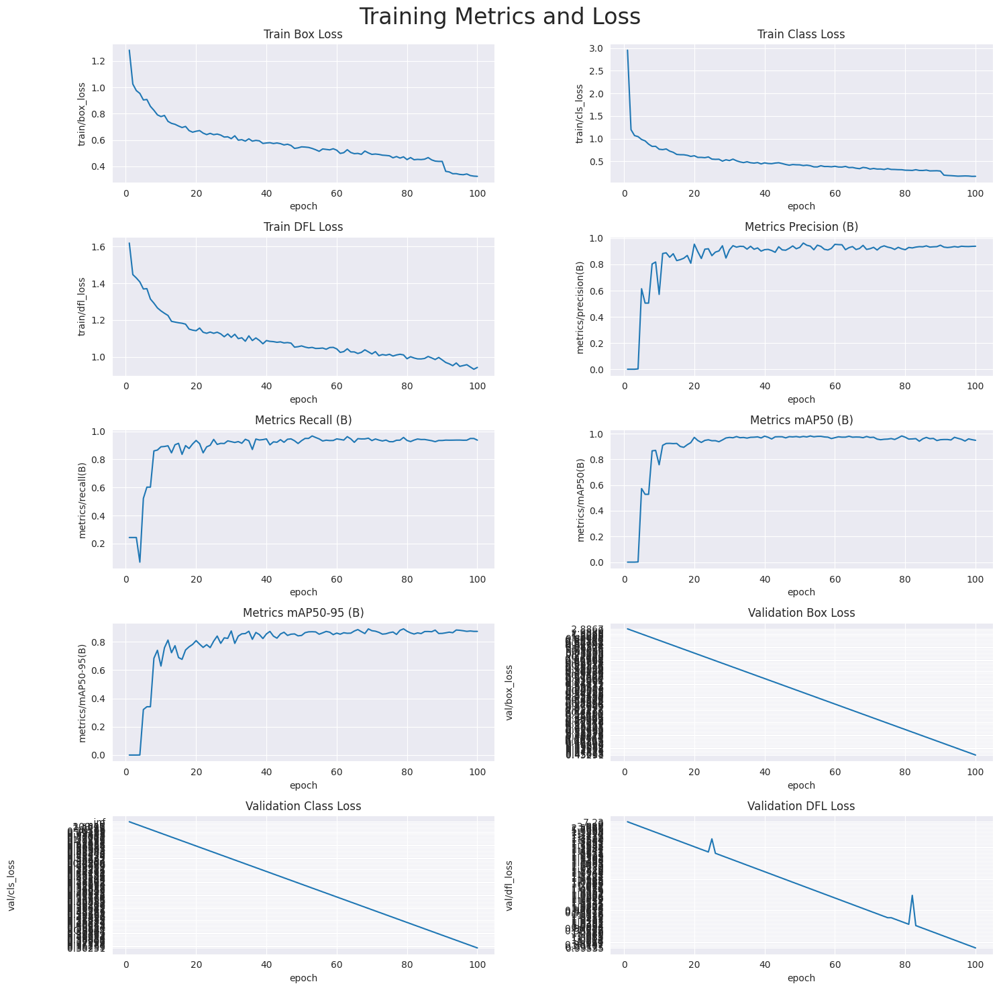

In [8]:
# read in the results.csv file as a pandas dataframe
RESULTS_PATH = '/kaggle/working/runs/detect/train/results.csv'
df = pd.read_csv(RESULTS_PATH)
df.columns = df.columns.str.strip()

# create subplots using seaborn
_, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

# 📊Evaluation


<h2>mAP Metrics</h2>

<p style="font-size:15px; font-family:verdana; line-height: 1.7em; "> <code>Mean Average Precision (mAP)</code> is a popular evaluation metric in object detection, including the YOLO model. It is used to assess the accuracy of an object detection model by measuring how well it can detect objects in an image, as well as the precision of those detections. mAP takes into account both the number of correctly identified objects and the quality of the detections, which means that it is a robust metric for assessing the performance of an object detection model.</p>


<p style="font-size:15px; font-family:verdana; line-height: 1.7em; ">In YOLO, mAP is particularly important because it measures the accuracy of the model in detecting objects of interest. The higher the mAP, the better the model is at identifying objects in an image. Since YOLO is an object detection model designed for real-time applications, achieving high mAP scores is crucial to ensure that the model can accurately detect objects in real-world scenarios. A high mAP score indicates that the model can effectively identify objects and can be used with confidence in real-world applications.</p>


<p style="font-size:15px; font-family:verdana; line-height: 1.7em; ">However, it is worth noting that mAP is not a perfect metric and has its limitations. For example, it does not account for the difficulty of detecting certain types of objects or the importance of different object classes. Nevertheless, it remains a widely used and valuable metric for evaluating object detection models such as YOLO. With its ability to provide a reliable assessment of a model's ability to detect objects, mAP is an essential tool for both researchers and practitioners in the field of computer vision.</p>



In [9]:
# Loading the best performing model
BEST_PT_PATH = '/kaggle/working/runs/detect/train/weights/best.pt'
best_pt_model = YOLO(BEST_PT_PATH)

# Evaluating the model on the test dataset
metrics = best_pt_model.val(conf = 0.25, split = 'test')

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs


val: Scanning /kaggle/input/dataset/test/labels... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<00:00, 236.79it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/dataset/test is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.85it/s]


                   all         71         71      0.912       0.91      0.933      0.842
                 awake         71         40      0.893       0.95      0.967      0.883
                drowsy         71         31      0.931      0.871      0.899      0.802
Speed: 1.7ms preprocess, 19.7ms inference, 0.0ms loss, 8.5ms postprocess per image
Results saved to runs/detect/val


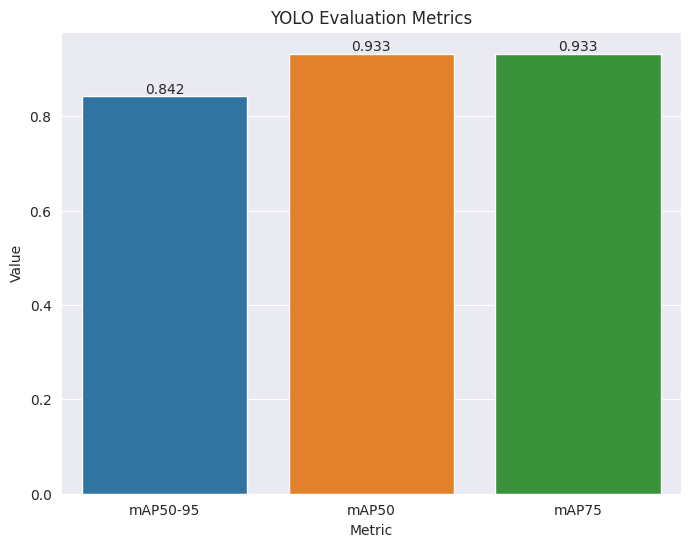

In [10]:
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

<div style="background-color:#f2f2f2; padding: 20px;">
<h2>Confusion Matrix</h2>

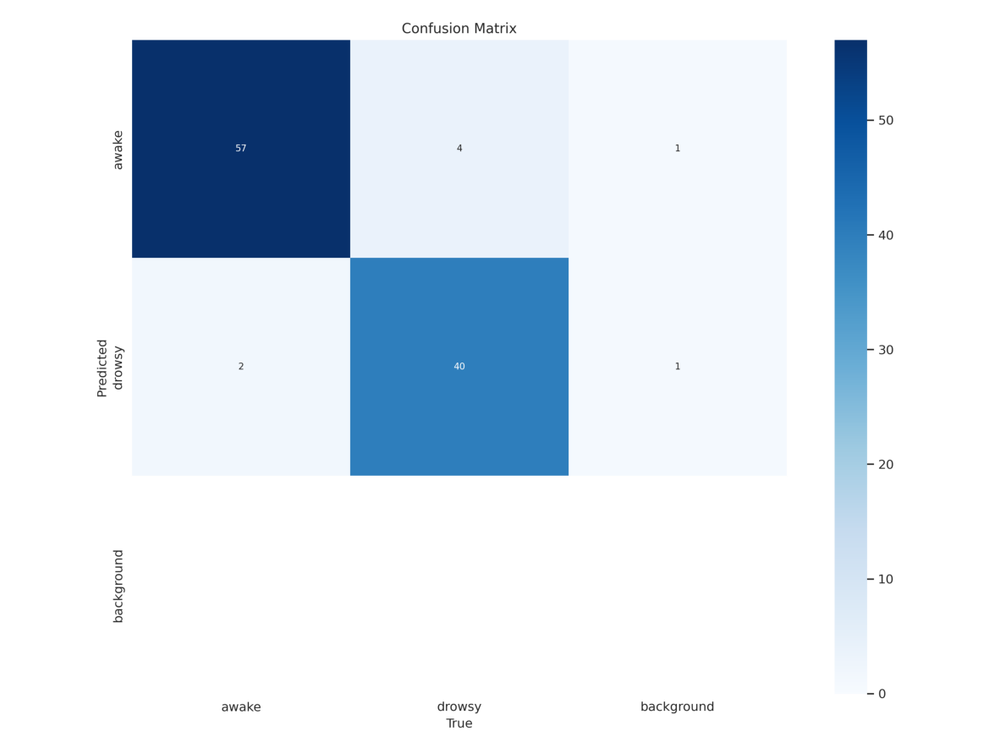

In [11]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

# Making Predictions
---

## Predict Images

In [12]:
# Function to perform detections

def driver_detect(img_path):
    """
        Perform object detection on the input image using a pre-trained detection model.

        Parameters
        ----------
        img_path : str
            The file path of the input image.

        Returns
        -------
        numpy.ndarray
            An RGB image with object detection results plotted.

        Examples
        --------
        >>> result_image = driver_detect("path/to/your/image.jpg")

        Notes
        -----
        This function reads an image from the specified file path, passes it through a pre-trained
        detection model, and plots the detection results on the image. The output is converted to RGB format
        for compatibility with common image visualization libraries.

        See Also
        --------
        cv2.imread, cv2.cvtColor, model (replace with the actual detection model)
    """
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = best_pt_model(img)  # Replace 'model' with the actual detection model

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 416x416 1 drowsy, 16.8ms
Speed: 3.3ms preprocess, 16.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 awake, 16.9ms
Speed: 1.2ms preprocess, 16.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 awake, 16.9ms
Speed: 1.2ms preprocess, 16.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 drowsy, 16.8ms
Speed: 1.2ms preprocess, 16.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 awake, 16.8ms
Speed: 1.2ms preprocess, 16.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 drowsy, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 awake, 15.5ms
Speed: 1.1ms preprocess, 15.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 416)

0: 416x416 1 drowsy, 15.5ms
Speed: 1.2ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 4

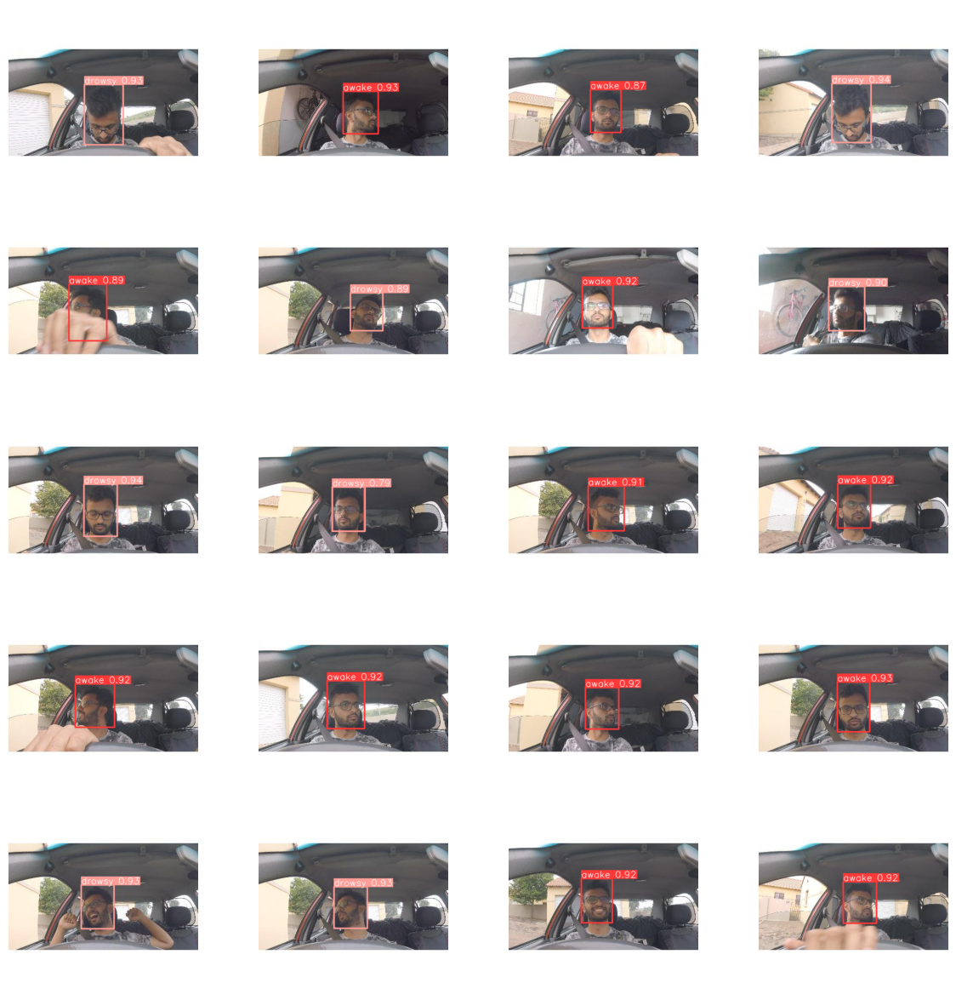

In [14]:
# Define the directory where the custom images are stored
CUSTOM_IMAGE_DIR = '/kaggle/input/dataset/test/images'

# Get the list of image files in the directory
IMAGE_FILES = os.listdir(CUSTOM_IMAGE_DIR)

# Select 20 random images from the list
SELECTED_IMAGES = random.sample(IMAGE_FILES, 20)

# Create a figure with subplots for each image
_, axes = plt.subplots(nrows=5, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for idx, img_file in enumerate(SELECTED_IMAGES):
    
    # Compute the row and column index of the current subplot
    ROW_IDX = idx // 4
    COL_IDX = idx % 4
    
    # Load the current image and run object detection
    IMG_PATH = os.path.join(CUSTOM_IMAGE_DIR, img_file)
    DETECT_IMG = driver_detect(IMG_PATH)
    
    # Plot the current image on the appropriate subplot
    axes[ROW_IDX, COL_IDX].imshow(DETECT_IMG)
    axes[ROW_IDX, COL_IDX].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

## Predict Videos

In [16]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt source='/kaggle/input/driving-test-vid/Drowsy_Driver.mp4'

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs

video 1/1 (1/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 72.9ms
video 1/1 (2/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.4ms
video 1/1 (3/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 19.9ms
video 1/1 (4/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.2ms
video 1/1 (5/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.2ms
video 1/1 (6/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.3ms
video 1/1 (7/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.3ms
video 1/1 (8/1501) /kaggle/input/driving-test-vid/Drowsy_Driver.mp4: 256x416 (no detections), 13.4ms
video 1/1 (9/15

In [17]:


def show_video(file_name, width=640):
    """
    Display a video file in a Jupyter Notebook using an HTML video player.

    Parameters
    ----------
    file_name : str
        The file path of the video file to be displayed.
    width : int, optional
        The width of the video player in pixels. Default is 640.

    Returns
    -------
    IPython.display.HTML
        An HTML widget displaying the video player.

    Examples
    --------
    >>> show_video("path/to/your/video.mp4", width=800)
    """
    # Read the video file and encode it in base64
    mp4 = open(file_name, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    # Generate HTML code for the video player widget
    return HTML("""
    <video width="{0}" controls>
        <source src="{1}" type="video/mp4">
    </video>
    """.format(width, data_url))

In [18]:
# Convert avi to mp4
!ffmpeg -y -loglevel panic -i /kaggle/working/runs/detect/predict/Drowsy_Driver.avi output.mp4

# output object tracking video
path_output = "output.mp4"
show_video(path_output, width=960)